In [ ]:
import tensorflow as tf
print(tf.__version__)

2.9.2


**Documentation followed:** 

[Installation](https://tensorflow-object-detection-api-tutorial.readthedocs.io/en/latest/install.html)

[Training Custom Object Detector](https://tensorflow-object-detection-api-tutorial.readthedocs.io/en/latest/training.html)

In [ ]:
mkdir TensorFlow

In [ ]:
cd /content/TensorFlow

/content/TensorFlow


In [ ]:
!pwd

/content/TensorFlow


In [ ]:
!git clone https://github.com/tensorflow/models.git

fatal: destination path 'models' already exists and is not an empty directory.


In [ ]:
cd models/research

/content/TensorFlow/models/research


In [ ]:
!protoc object_detection/protos/*.proto --python_out=.

In [ ]:
#coco api installation
!pip install cython
!pip install git+https://github.com/philferriere/cocoapi.git#subdirectory=PythonAPI

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/philferriere/cocoapi.git to /tmp/pip-req-build-_nixlwkr
  Running command git clone -q https://github.com/philferriere/cocoapi.git /tmp/pip-req-build-_nixlwkr
  Created wheel for pycocotools: filename=pycocotools-2.0-cp37-cp37m-linux_x86_64.whl size=265224 sha256=f656b29eca2d2f4e9ff3d2c7ecd7dec92c1333ca4b04afa4aa90f5ce012a229e
  Stored in directory: /tmp/pip-ephem-wheel-cache-q8p2hogp/wheels/6b/c6/c5/cb6da4cb793a6cb1ab91f6578d76c42686422127eb4dbcea94
Successfully built pycocotools
  Attempting uninstall: pycocotools
    Found existing installation: pycocotools 2.0.5
    Uninstalling pycocotools-2.0.5:
      Successfully uninstalled pycocotools-2.0.5


In [ ]:
# installing the object detection api
!cp object_detection/packages/tf2/setup.py .
!python -m pip install --use-feature=2020-resolver .

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Processing /content/TensorFlow/models/research
  DEPRECATION: A future pip version will change local packages to be built in-place without first copying to a temporary directory. We recommend you use --use-feature=in-tree-build to test your packages with this new behavior before it becomes the default.
   pip 21.3 will remove support for this functionality. You can find discussion regarding this at https://github.com/pypa/pip/issues/7555.
     |████████████████████████████████| 11.0 MB 24.2 MB/s 
     |████████████████████████████████| 352 kB 53.5 MB/s 
     |████████████████████████████████| 2.2 MB 55.1 MB/s 
     |████████████████████████████████| 25.0 MB 1.3 MB/s 
     |████████████████████████████████| 67 kB 6.7 MB/s 
     |████████████████████████████████| 116 kB 73.3 MB/s 
     |████████████████████████████████| 5.9 MB 48.7 MB/s 
     |████████████████████████████████| 1.1 MB 54.0 M

In [ ]:
# testing the installation
!python object_detection/builders/model_builder_tf2_test.py

2022-10-31 18:21:27.936784: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-10-31 18:21:28.703244: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2022-10-31 18:21:28.703443: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2022-10-31 18:21:28.703464: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed p

**Creating custom object detector**

In [ ]:
cd /content/TensorFlow

In [ ]:
!mkdir scripts
!mkdir workspace

In [ ]:
%%bash
cd scripts 
mkdir preprocessing

In [ ]:
%%bash
cd workspace
mkdir training_demo
cd training_demo
mkdir annotations
mkdir models
mkdir exported-models
mkdir images
mkdir pre-trained-models
cd images
mkdir train
mkdir test

dataset link - https://public.roboflow.com/object-detection/aquarium

In [ ]:
cd /content/TensorFlow/scripts/preprocessing

/content/TensorFlow/scripts/preprocessing


In [ ]:
!python generate_tfrecord.py -x /content/TensorFlow/workspace/training_demo/images/train -l /content/TensorFlow/workspace/training_demo/annotations/label_map.pbtxt -o /content/TensorFlow/workspace/training_demo/annotations/train.record

2022-10-31 18:27:41.908011: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
Successfully created the TFRecord file: /content/TensorFlow/workspace/training_demo/annotations/train.record


In [ ]:
!python generate_tfrecord.py -x /content/TensorFlow/workspace/training_demo/images/test -l /content/TensorFlow/workspace/training_demo/annotations/label_map.pbtxt -o /content/TensorFlow/workspace/training_demo/annotations/test.record

2022-10-31 18:27:49.681604: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
Successfully created the TFRecord file: /content/TensorFlow/workspace/training_demo/annotations/test.record


In [ ]:
# download the pretrained dataset
%%bash 
cd /content/TensorFlow/workspace/training_demo/pre-trained-models/
curl -o ssd_mobilenet_v1_fpn_640x640_coco17_tpu-8.tar.gz http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v1_fpn_640x640_coco17_tpu-8.tar.gz

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 86.2M  100 86.2M    0     0  40.7M      0  0:00:02  0:00:02 --:--:-- 40.7M


In [ ]:
# extract the pretrained dataset
%%bash
cd /content/TensorFlow/workspace/training_demo/pre-trained-models/
tar -xvzf ssd_mobilenet_v1_fpn_640x640_coco17_tpu-8.tar.gz

ssd_mobilenet_v1_fpn_640x640_coco17_tpu-8/
ssd_mobilenet_v1_fpn_640x640_coco17_tpu-8/checkpoint/
ssd_mobilenet_v1_fpn_640x640_coco17_tpu-8/checkpoint/ckpt-0.data-00000-of-00001
ssd_mobilenet_v1_fpn_640x640_coco17_tpu-8/checkpoint/checkpoint
ssd_mobilenet_v1_fpn_640x640_coco17_tpu-8/checkpoint/ckpt-0.index
ssd_mobilenet_v1_fpn_640x640_coco17_tpu-8/pipeline.config
ssd_mobilenet_v1_fpn_640x640_coco17_tpu-8/saved_model/
ssd_mobilenet_v1_fpn_640x640_coco17_tpu-8/saved_model/saved_model.pb
ssd_mobilenet_v1_fpn_640x640_coco17_tpu-8/saved_model/variables/
ssd_mobilenet_v1_fpn_640x640_coco17_tpu-8/saved_model/variables/variables.data-00000-of-00001
ssd_mobilenet_v1_fpn_640x640_coco17_tpu-8/saved_model/variables/variables.index


In [ ]:
%%bash
cd /content/TensorFlow/workspace/training_demo/models
mkdir my_ssd_mobilenet_v1_fpn
cd ..
cp -v pre-trained-models/ssd_mobilenet_v1_fpn_640x640_coco17_tpu-8/pipeline.config  models/my_ssd_mobilenet_v1_fpn/pipeline.config

'pre-trained-models/ssd_mobilenet_v1_fpn_640x640_coco17_tpu-8/pipeline.config' -> 'models/my_ssd_mobilenet_v1_fpn/pipeline.config'


In [ ]:
%%bash
cd /content/TensorFlow/
cp -v models/research/object_detection/model_main_tf2.py workspace/training_demo/model_main_tf2.py

'models/research/object_detection/model_main_tf2.py' -> 'workspace/training_demo/model_main_tf2.py'


In [ ]:
cd /content/TensorFlow/workspace/training_demo


/content/TensorFlow/workspace/training_demo


In [ ]:
!pip install tensorflow-gpu

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 578.0 MB 15 kB/s 


In [ ]:
!python model_main_tf2.py --model_dir=models/my_ssd_mobilenet_v1_fpn --pipeline_config_path=models/my_ssd_mobilenet_v1_fpn/pipeline.config

2022-10-31 18:42:05.994469: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-10-31 18:42:06.925204: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2022-10-31 18:42:06.925364: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2022-10-31 18:42:06.925385: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed p

In [ ]:
# start Tensorboard

# cd into training_demo
%cd '/content/TensorFlow/workspace/training_demo'

# start the Tensorboard
%load_ext tensorboard
%tensorboard --logdir=models/my_ssd_mobilenet_v1_fpn

/content/TensorFlow/workspace/training_demo


<IPython.core.display.Javascript object>

In [ ]:
%%bash
cd /content/TensorFlow/
cp -v models/research/object_detection/exporter_main_v2.py workspace/training_demo/exporter_main_v2.py 

'models/research/object_detection/exporter_main_v2.py' -> 'workspace/training_demo/exporter_main_v2.py'


In [ ]:
# export the trained model

!python exporter_main_v2.py --input_type image_tensor --pipeline_config_path ./models/my_ssd_mobilenet_v1_fpn/pipeline.config --trained_checkpoint_dir ./models/my_ssd_mobilenet_v1_fpn/ --output_directory ./exported-models/my_model

2022-10-31 18:59:47.153051: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-10-31 18:59:47.916932: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2022-10-31 18:59:47.917041: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2022-10-31 18:59:47.917061: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed p

Loading model...Done! Took 11.364067792892456 seconds
Running inference for /content/TensorFlow/workspace/training_demo/images/train/image16.jpg... Done


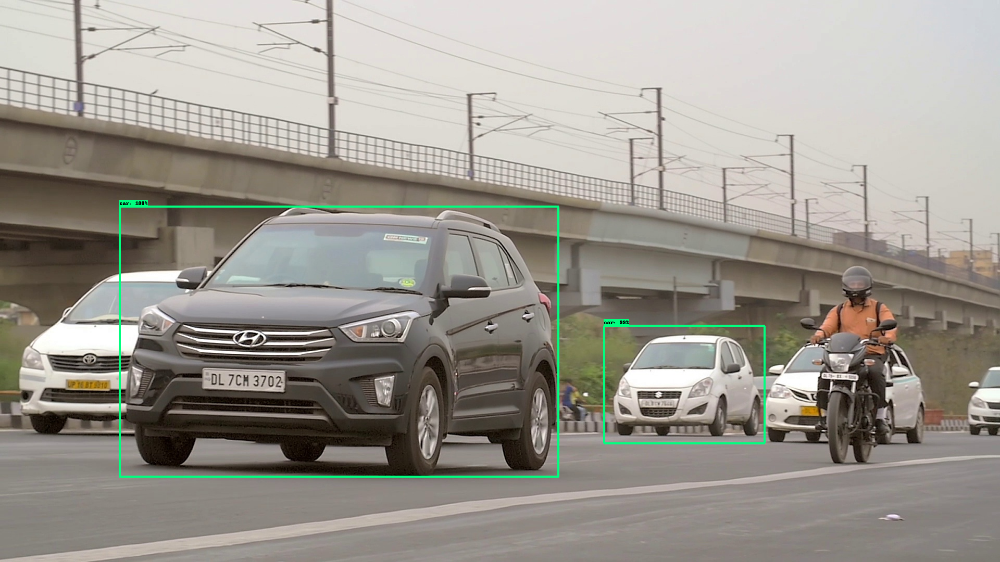

In [ ]:
"""
Object Detection (On Image) From TF2 Saved Model
=====================================
"""

import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'    # Suppress TensorFlow logging (1)
import pathlib
import tensorflow as tf
import cv2
import argparse
from google.colab.patches import cv2_imshow

# Enable GPU dynamic memory allocation
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

# PROVIDE PATH TO IMAGE DIRECTORY
IMAGE_PATHS = '/content/TensorFlow/workspace/training_demo/images/train/image16.jpg'


# PROVIDE PATH TO MODEL DIRECTORY
PATH_TO_MODEL_DIR = '/content/training_demo/exported_models/my_model'

# PROVIDE PATH TO LABEL MAP
PATH_TO_LABELS = '/content/TensorFlow/workspace/training_demo/annotations/label_map.pbtxt'

# PROVIDE THE MINIMUM CONFIDENCE THRESHOLD
MIN_CONF_THRESH = float(0.60)

# LOAD THE MODEL

import time
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils

PATH_TO_SAVED_MODEL = PATH_TO_MODEL_DIR + "/saved_model"

print('Loading model...', end='')
start_time = time.time()

# LOAD SAVED MODEL AND BUILD DETECTION FUNCTION
detect_fn = tf.saved_model.load("/content/TensorFlow/workspace/training_demo/exported-models/my_model/saved_model")

end_time = time.time()
elapsed_time = end_time - start_time
print('Done! Took {} seconds'.format(elapsed_time))

# LOAD LABEL MAP DATA FOR PLOTTING

category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS,
                                                                    use_display_name=True)

import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')   # Suppress Matplotlib warnings

def load_image_into_numpy_array(path):
    """Load an image from file into a numpy array.
    Puts image into numpy array to feed into tensorflow graph.
    Note that by convention we put it into a numpy array with shape
    (height, width, channels), where channels=3 for RGB.
    Args:
      path: the file path to the image
    Returns:
      uint8 numpy array with shape (img_height, img_width, 3)
    """
    return np.array(Image.open(path))




print('Running inference for {}... '.format(IMAGE_PATHS), end='')

image = cv2.imread(IMAGE_PATHS)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_expanded = np.expand_dims(image_rgb, axis=0)

# The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
input_tensor = tf.convert_to_tensor(image)
# The model expects a batch of images, so add an axis with `tf.newaxis`.
input_tensor = input_tensor[tf.newaxis, ...]

# input_tensor = np.expand_dims(image_np, 0)
detections = detect_fn(input_tensor)

# All outputs are batches tensors.
# Convert to numpy arrays, and take index [0] to remove the batch dimension.
# We're only interested in the first num_detections.
num_detections = int(detections.pop('num_detections'))
detections = {key: value[0, :num_detections].numpy()
               for key, value in detections.items()}
detections['num_detections'] = num_detections

# detection_classes should be ints.
detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

image_with_detections = image.copy()

# SET MIN_SCORE_THRESH BASED ON YOU MINIMUM THRESHOLD FOR DETECTIONS
viz_utils.visualize_boxes_and_labels_on_image_array(
      image_with_detections,
      detections['detection_boxes'],
      detections['detection_classes'],
      detections['detection_scores'],
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=0.5,
      agnostic_mode=False)

print('Done')
# DISPLAYS OUTPUT IMAGE
cv2_imshow(image_with_detections)
# CLOSES WINDOW ONCE KEY IS PRESSED
